#### WRF Example Notebook with DASK

Demonstrates using ldcpy on wrf CONUS 404 data. 

On NCAR's Jupyterhub, environment NPL 2024b is a good option (Note: it contains an old version of ldcpy that does not support WRF data.  So make sure you have a recent version from https://github.com/NCAR/ldcpy.)

To look at SPERR-compressed data, you need the HDF5 plugin installed and the path specified in HDF5_PLUGIN_PATH. So let's verify that. (Note, I have all my plugins in the same zfp directory)


In [1]:
import os
# if this environment variable is not set, then you can set it as needed:
os.environ['HDF5_PLUGIN_PATH'] = '/glade/work/abaker/compress-libs/plugins_mar26/lib64'

In [2]:
import sys

import cf_xarray as cf
import xarray as xr
import xwrf

%load_ext autoreload
%autoreload 2
%matplotlib inline

# loading our own ldcpy repo
sys.path.insert(0, '/glade/u/home/abaker/repos/my_ldcpy')
# suppress all of the divide by zero warnings
import warnings

# sys.path.insert(0, '/../../../')
import ldcpy

warnings.filterwarnings("ignore")

Now we will use dask for parallelization on Casper

In [3]:
import dask
from dask_jobqueue import PBSCluster

In [4]:
cluster = PBSCluster(
    # Basic job directives
    job_name='ldcpy-wrf-nb',
    queue='casper',
    walltime='60:00',
    # your project code
    account='NTDD0004',
    log_directory='dask-logs',
    # These settings impact the resources assigned to the job
    cores=1,
    memory='10GiB',
    resource_spec='select=1:ncpus=1:mem=10GB',
    # These settings define the resources assigned to a worker
    processes=1,
    # This controls where Dask will write data to disk if memory is exhausted
    local_directory='/local_scratch/pbs.$PBS_JOBID/dask/spill',
    # This specifies which network interface the cluster will use
    interface='ext',
    env_extra=[
    'export HDF5_PLUGIN_PATH=/glade/work/abaker/compress-libs/plugins_mar26/lib64'
]
)

In [5]:
from dask.distributed import Client

# Attach a "client" to our created cluster
client = Client(cluster)

# Display the client
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abaker/proxy/44539/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abaker/proxy/44539/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.173:38145,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abaker/proxy/44539/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [6]:
# Scale the cluster adaptively
cluster.adapt(minimum_jobs=1, maximum_jobs=36)
# Scale the cluster to some number of workers
# cluster.scale(2)
# Block progress until workers have spawned (optional - typically only in demos and benchmarks!)
# cluster.wait_for_workers(2)

In [7]:
# See the workers in the job scheduler
!qstat -u $USER


casper-pbs:
                                                            Req'd  Req'd   Elap 
Job ID          Username Queue    Jobname    SessID NDS TSK Memory Time  S Time 
--------------- -------- -------- ---------- ------ --- --- ------ ----- - -----
2864436.casper* abaker   htc      cr-jhub-b*  28773   1   1    4gb 02:00 R 00:21


To look at SPERR-compressed data, you need the HDF5 plugin installed and the path specified in HDF5_PLUGIN_PATH. So let's verify that. (Note, I have all my plugins in the same zfp directory)

In [11]:
# let's grab all the 2d data
# Some CONUS 404 wrf data to look at (24 hourly sliced put into a single file)
# (wrf2d_d01_2020-07-01_00:00:00 => wrf2d_d01_2020-07-01_23:00:00 , and then for 3d also)

# get the file names
mydir = "/glade/campaign/cisl/asap/abaker/wrf_update/wrf_24hr_combined_files/allvars/wrf_compress/"
file2d = "wrf2d_combined.nc"

# original data (lossless)
orig_file2d = mydir + "lossless/" + file2d

# look at a granular bit rounded file w/2,3,4,5 sig figs
gbr2_file2d = mydir + "gbr_2/" + file2d
gbr3_file2d = mydir + "gbr_3/" + file2d
gbr4_file2d = mydir + "gbr_4/" + file2d
gbr5_file2d = mydir + "gbr_5/" + file2d

# look at a sperr file with pwe=1e-1, 1e-2, 1e-3, 1e-4
sp_p80_file2d = mydir + "sperr_psnr80/" + file2d
sp_p100_file2d = mydir + "sperr_psnr100/" + file2d
sp_p120_file2d = mydir + "sperr_psnr120/" + file2d
sp_p140_file2d = mydir + "sperr_psnr140/" + file2d


# this contains lat/lon info
fileconsts = "/glade/campaign/cisl/asap/abaker/wrf_update/wrfconstants_usgs404.nc"

In [12]:
# file sizes? (optional to include in table)
my_sizes = []
my_sizes.append(os.path.getsize(orig_file2d))

my_sizes.append(os.path.getsize(gbr2_file2d))
my_sizes.append(os.path.getsize(gbr3_file2d))
my_sizes.append(os.path.getsize(gbr4_file2d))
my_sizes.append(os.path.getsize(gbr5_file2d))

my_sizes.append(os.path.getsize(sp_p80_file2d))
my_sizes.append(os.path.getsize(sp_p100_file2d))
my_sizes.append(os.path.getsize(sp_p120_file2d))
my_sizes.append(os.path.getsize(sp_p140_file2d))

print(my_sizes)

[11341441631, 3807316636, 5876781563, 7651417237, 8596196820, 3639620997, 5027730443, 6473551294, 7949733382]


In [13]:
# open all files as a dataset and process with xwrf for use with xarray
ds_orig = xr.open_dataset(orig_file2d, engine="netcdf4", chunks={"time": 1}).xwrf.postprocess()

ds_gbr2 = xr.open_dataset(gbr2_file2d, engine="netcdf4", chunks={"time": 1}).xwrf.postprocess()
ds_gbr3 = xr.open_dataset(gbr3_file2d, engine="netcdf4", chunks={"time": 1}).xwrf.postprocess()
ds_gbr4 = xr.open_dataset(gbr4_file2d, engine="netcdf4", chunks={"time": 1}).xwrf.postprocess()
ds_gbr5 = xr.open_dataset(gbr5_file2d, engine="netcdf4", chunks={"time": 1}).xwrf.postprocess()

ds_sp_p80 = xr.open_dataset(
    sp_p80_file2d, engine="netcdf4", chunks={"time": 1}
).xwrf.postprocess()
ds_sp_p100 = xr.open_dataset(
    sp_p100_file2d, engine="netcdf4", chunks={"time": 1}
).xwrf.postprocess()
ds_sp_p120 = xr.open_dataset(
    sp_p120_file2d, engine="netcdf4", chunks={"time": 1}
).xwrf.postprocess()
ds_sp_p140 = xr.open_dataset(
    sp_p140_file2d, engine="netcdf4", chunks={"time": 1}
).xwrf.postprocess()

# coordinates
ds_const = xr.open_dataset(fileconsts, engine="netcdf4").xwrf.postprocess()

In [15]:
# make an ldcpy collection of all of this data to compare data (and pick a few variables to load).
# Passing in the file sizes is optional, but allows you to compare compression rates in the tables - here we are comparing
# to the lossless size
combine_col = ldcpy.collect_datasets(
    "wrf",
    ["T2", "U10", "Q2", "V10", "U", "V", "SNLIQ"],
    [
        ds_orig,
        ds_gbr2,
        ds_gbr3,
        ds_gbr4,
        ds_gbr5,
        ds_sp_p80,
        ds_sp_p100,
        ds_sp_p120,
        ds_sp_p140,
    ],
    [
        "lossless",
        "gbr2",
        "gbr3",
        "gbr4",
        "gbr5",
        "sperr_psnr80",
        "sperr_psnr100",
        "sperr_psnr120",
        "sperr_psnr140",
    ],
    coords_ds=ds_const,
    file_sizes=my_sizes,
)

dataset size in GB 10.82



In [16]:
# quick look at collection dataset
combine_col

<xarray.Dataset> Size: 11GB
Dimensions:     (collection: 9, Time: 24, y: 1015, x: 1367, x_stag: 1368,
                 y_stag: 1016, snow_layers_stag: 3)
Coordinates: (12/13)
    XTIME       (Time) datetime64[ns] 192B 2020-07-01 ... 2020-07-01T23:00:00
  * Time        (Time) datetime64[ns] 192B 2020-07-01 ... 2020-07-01T23:00:00
    XLAT        (y, x) float32 6MB 17.65 17.66 17.67 17.68 ... 51.73 51.71 51.69
    XLONG       (y, x) float32 6MB -122.6 -122.5 -122.5 ... -57.17 -57.12 -57.07
    XLAT_U      (y, x_stag) float32 6MB 17.64 17.65 17.66 ... 51.72 51.7 51.69
    XLONG_U     (y, x_stag) float32 6MB -122.6 -122.6 -122.5 ... -57.09 -57.04
    ...          ...
    XLONG_V     (y_stag, x) float32 6MB -122.6 -122.5 -122.5 ... -57.11 -57.06
  * y           (y) float64 8kB -2.028e+06 -2.024e+06 ... 2.024e+06 2.028e+06
  * x_stag      (x_stag) float64 11kB -2.734e+06 -2.73e+06 ... 2.734e+06
  * y_stag      (y_stag) float64 8kB -2.03e+06 -2.026e+06 ... 2.026e+06 2.03e+06
  * x           (x) float64 11kB -2.732e+06 -2.728e+06 ... 2.728e+06 2.732e+06
  * collection  (collection) <U13 468B 'lossless' 'gbr2' ... 'sperr_psnr140'
Dimensions without coordinates: snow_layers_stag
Data variables:
    T2          (collection, Time, y, x) float32 1GB dask.array<chunksize=(1, 1, 1015, 1367), meta=np.ndarray>
    U10         (collection, Time, y, x) float32 1GB dask.array<chunksize=(1, 1, 1015, 1367), meta=np.ndarray>
    Q2          (collection, Time, y, x) float32 1GB dask.array<chunksize=(1, 1, 1015, 1367), meta=np.ndarray>
    V10         (collection, Time, y, x) float32 1GB dask.array<chunksize=(1, 1, 1015, 1367), meta=np.ndarray>
    U           (collection, Time, y, x_stag) float32 1GB dask.array<chunksize=(1, 1, 1015, 1368), meta=np.ndarray>
    V           (collection, Time, y_stag, x) float32 1GB dask.array<chunksize=(1, 1, 1016, 1367), meta=np.ndarray>
    SNLIQ       (collection, Time, snow_layers_stag, y, x) float32 4GB dask.array<chunksize=(1, 1, 2, 1015, 1367), meta=np.ndarray>
Attributes: (12/152)
    TITLE:                            OUTPUT FROM WRF V3.9.1.1 MODEL
    START_DATE:                      2020-06-05_00:00:00
    SIMULATION_START_DATE:           1979-10-01_00:00:00
    WEST-EAST_GRID_DIMENSION:        1368
    SOUTH-NORTH_GRID_DIMENSION:      1016
    BOTTOM-TOP_GRID_DIMENSION:       51
    ...                              ...
    history:                         Wed May  4 13:07:22 2022: ncrcat -A -vW ...
    history_of_appended_files:       Wed May  4 13:07:22 2022: Appended file ...
    cell_measures:                   area: cell_area
    data_type:                       wrf
    file_size:                       {'lossless': 11341441631, 'gbr2': 380731...
    weighted:                        False

In [17]:
# look at variable T2 statistics at 12 hours, we'll compare the bit grooming variants first
# we use the label we passed in when creating this collection
# gbr2 is the most aggressive and gbr5 is the least
# gbr# = Granular Bit Rounding with # significant digits preserved

# grab time slice of interest
col_time12 = combine_col.isel(Time=12)

# view chart of statistics
ldcpy.compare_stats(
    col_time12,
    "T2",
    ["lossless", "gbr2", "gbr3", "gbr4", "gbr5"],
    significant_digits=7,
    aggregate_dims=["y", "x"],
)

,lossless,gbr2,gbr3,gbr4,gbr5
mean,292.5255,292.8637,292.5254,292.5255,292.5255
variance,44.65586,53.53793,44.76316,44.65684,44.65585
standard deviation,6.682506,7.316965,6.69053,6.68258,6.682506
min value,267.6981,264,268,267.6875,267.6953
min (abs) nonzero value,267.6981,264,268,267.6875,267.6953
max value,303.3593,304,303,303.375,303.3594
probability positive,1,1,1,1,1
number of zeros,0,0,0,0,0
99% real information cutoff bit,19,14,17,19,19
entropy estimate,0.3861147,0.007776549,0.03400087,0.1291291,0.2243553


,gbr2,gbr3,gbr4,gbr5
max abs diff,4,0.5,0.03125,0.00390625
min abs diff,0,0,0,0
mean abs diff,2.134887,0.2493174,0.01561545,0.001953188
mean squared diff,0.1143801,9.907887e-09,1.000604e-09,2.151297e-10
root mean squared diff,2.408204,0.2881453,0.01803118,0.002255271
normalized root mean squared diff,0.06752998,0.008080067,0.0005056237,6.32415e-05
normalized max pointwise error,0.1121657,0.01401996,0.0008754454,0.0001086819
pearson correlation coefficient,0.9459816,0.9990722,0.9999964,0.9999999
ks p-value,0,0,3.169477e-09,0.9954106
spatial relative error(% > 0.0001),99.41535,94.09999,6.336842,0


In [18]:
# let's look at the sperr results for T2 time 12 (note these could be in the same table as the gbr results, \
# and the table would just be larger)
# sperr_pweX = sperr with pointwise error tolerance X
# sperr_psnrX = sperr with peak-signal-to-noise ratio X

# view chart of statistics
ldcpy.compare_stats(
    col_time12,
    "T2",
    [
        "lossless",
        "sperr_psnr80",
        "sperr_psnr100",
        "sperr_psnr120",
        "sperr_psnr140",
    ],
    significant_digits=7,
    aggregate_dims=["y", "x"],
)

,lossless,sperr_psnr80,sperr_psnr100,sperr_psnr120,sperr_psnr140
mean,292.5255,292.5255,292.5255,292.5255,292.5255
variance,44.65586,44.6559,44.65586,44.65586,44.65586
standard deviation,6.682506,6.682509,6.682506,6.682506,6.682506
min value,267.6981,267.6951,267.6982,267.6981,267.6981
min (abs) nonzero value,267.6981,267.6951,267.6982,267.6981,267.6981
max value,303.3593,303.3626,303.3588,303.3593,303.3593
probability positive,1,1,1,1,1
number of zeros,0,0,0,0,0
99% real information cutoff bit,19,19,19,19,19
entropy estimate,0.3861147,0.3860368,0.3861112,0.3860506,0.3861147


,sperr_psnr80,sperr_psnr100,sperr_psnr120,sperr_psnr140
max abs diff,0.01657104,0.001312256,0.0001525879,0
min abs diff,0,0,0,0
mean abs diff,0.002852639,0.0002454069,2.832681e-05,0
mean squared diff,6.144173e-12,2.205443e-14,6.0683e-18,0
root mean squared diff,0.003552745,0.0003051018,3.730811e-05,0
normalized root mean squared diff,9.962479e-05,8.555553e-06,1.04618e-06,0
normalized max pointwise error,0.0004304487,3.508628e-05,4.278814e-06,0
pearson correlation coefficient,0.9999999,1,1,1
ks p-value,1,1,1,1
spatial relative error(% > 0.0001),0,0,0,0


In [19]:
# let's put results gbr5 and sperr1-3 with similar CR in the same table
# the psnr results are quite nice also
ldcpy.compare_stats(
    col_time12,
    "T2",
    ["lossless", "gbr3",  "sperr_psnr100"],
    significant_digits=7,
    aggregate_dims=["y", "x"],
)

,lossless,gbr3,sperr_psnr100
mean,292.5255,292.5254,292.5255
variance,44.65586,44.76316,44.65586
standard deviation,6.682506,6.69053,6.682506
min value,267.6981,268,267.6982
min (abs) nonzero value,267.6981,268,267.6982
max value,303.3593,303,303.3588
probability positive,1,1,1
number of zeros,0,0,0
99% real information cutoff bit,19,17,19
entropy estimate,0.3861147,0.03400087,0.3861112


,gbr3,sperr_psnr100
max abs diff,0.5,0.001312256
min abs diff,0,0
mean abs diff,0.2493174,0.0002454069
mean squared diff,9.907887e-09,2.205443e-14
root mean squared diff,0.2881453,0.0003051018
normalized root mean squared diff,0.008080067,8.555553e-06
normalized max pointwise error,0.01401996,3.508628e-05
pearson correlation coefficient,0.9990722,1
ks p-value,0,1
spatial relative error(% > 0.0001),94.09999,0


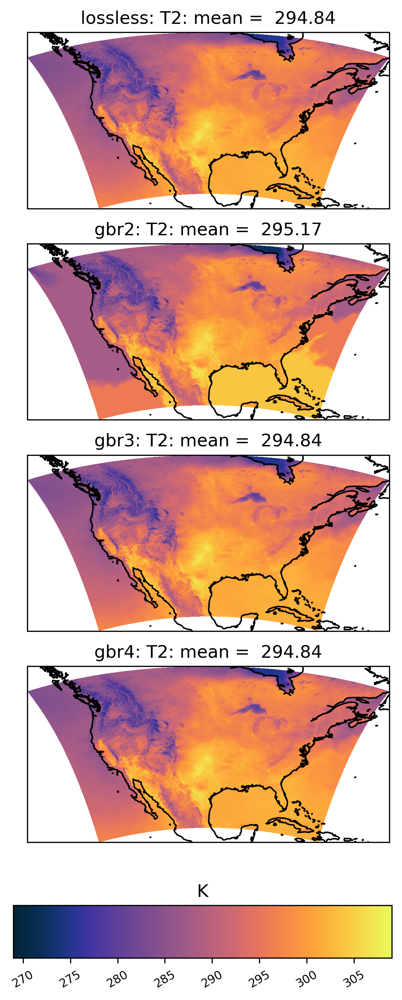

In [20]:
# plot mean T2 field (across 24 time slices) for several compression options for GBR
ldcpy.plot(
    combine_col,
    "T2",
    sets=["lossless", "gbr2", "gbr3", "gbr4"],
    calc="mean",
    plot_type="spatial",
    color="cmo.thermal",
    vert_plot=True,
)

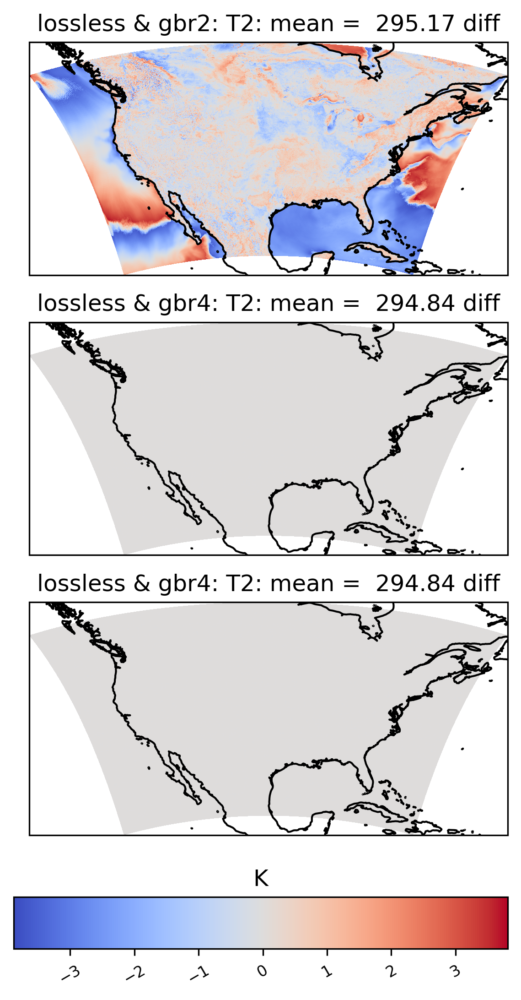

In [21]:
# plot difference in the mean T2 field - for a couple of compression options across all 24 time slices
ldcpy.plot(
    combine_col,
    "T2",
    sets=["lossless", "gbr2", "gbr4", "gbr4"],
    calc="mean",
    calc_type="diff",
    vert_plot=True,
)

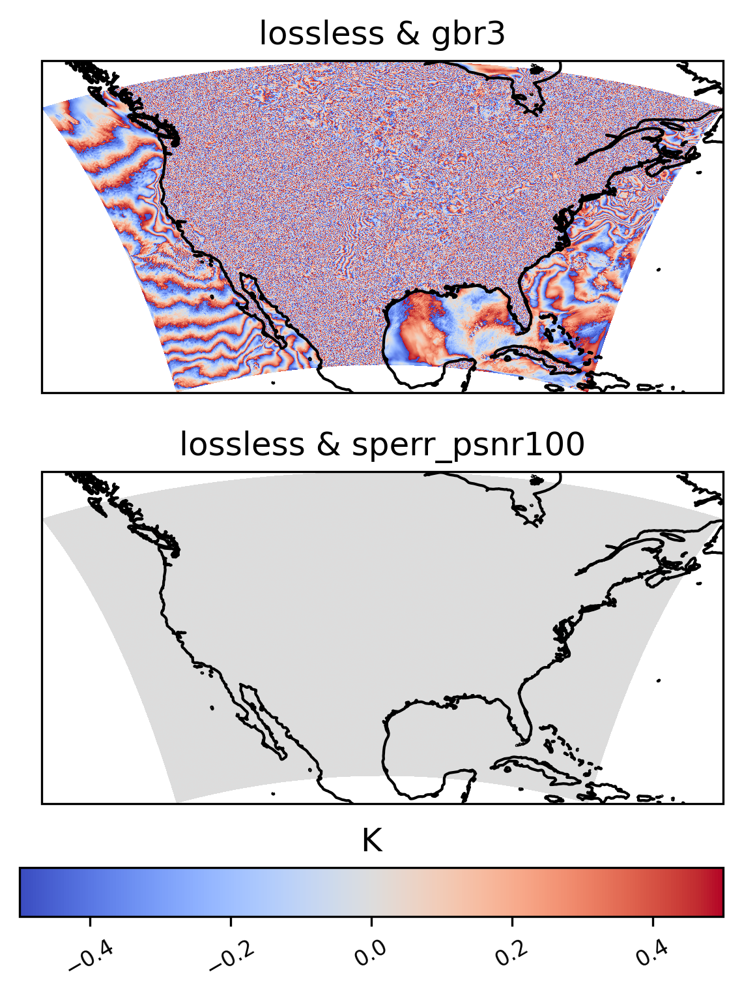

In [22]:
# plot differences in mean T2 field - just at one time slice (start = 0, end = 0)
ldcpy.plot(
    combine_col,
    "T2",
    sets=["lossless", "gbr3", "sperr_psnr100"],
    calc="mean",
    calc_type="diff",
    vert_plot=True,
    start=0,
    end=0,
    short_title=True,
)

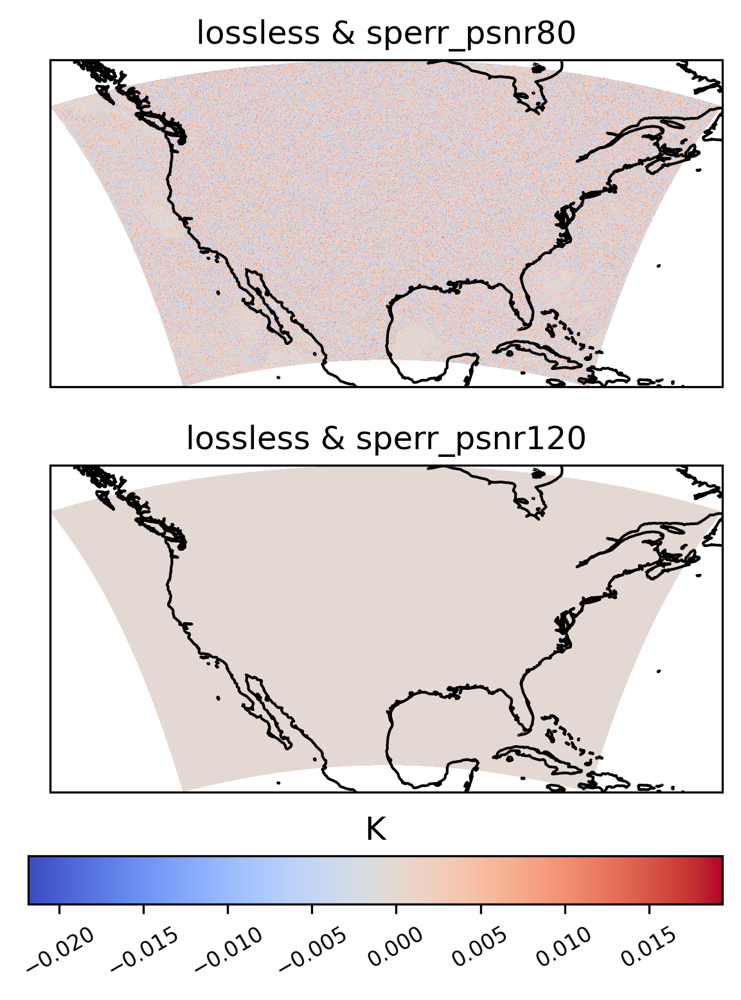

In [23]:
# plot differences in mean T2 field - just at one time slice (start = 0, end = 0)
# just sperr
ldcpy.plot(
    combine_col,
    "T2",
    sets=["lossless", "sperr_psnr80", "sperr_psnr120"],
    calc="mean",
    calc_type="diff",
    vert_plot=True,
    start=0,
    end=0,
    short_title=True,
)

In [24]:
# Now let's look at wind at time=0- notice agg dims are different
col_time0 = combine_col.isel(Time=0)

ldcpy.compare_stats(
    col_time0,
    "U",
    [
        "lossless",
        "gbr2",
        "gbr3",
        "gbr4",
        "sperr_psnr80",
        "sperr_psnr100",
        "sperr_psnr120",
        "sperr_psnr140",
    ],
    significant_digits=7,
    aggregate_dims=["y", "x_stag"],
)

,lossless,gbr2,gbr3,gbr4,sperr_psnr80,sperr_psnr100,sperr_psnr120,sperr_psnr140
mean,0.1099268,0.1097178,0.1099291,0.1099268,0.1099258,0.1099262,0.1099268,0.1099268
variance,16.22078,16.21651,16.22076,16.22078,16.22081,16.22078,16.22078,16.22078
standard deviation,4.027504,4.026974,4.027502,4.027505,4.027509,4.027504,4.027504,4.027504
min value,-20.23387,-20,-20.25,-20.23438,-20.22892,-20.23444,-20.23392,-20.23386
min (abs) nonzero value,3.146056e-06,3.159046e-06,3.144145e-06,3.146008e-06,1.063128e-05,5.339411e-06,1.534698e-06,1.103544e-06
max value,20.24547,20,20.25,20.24219,20.24152,20.24629,20.24551,20.24546
probability positive,0.4819635,0.4819635,0.4819635,0.4819635,0.4819815,0.4819729,0.4819628,0.4819635
number of zeros,0,0,0,0,0,0,0,0
99% real information cutoff bit,11,15,18,21,11,11,11,11
entropy estimate,0.5260497,0.1748702,0.2553095,0.3252425,0.5260644,0.5260506,0.5260688,0.525978


,gbr2,gbr3,gbr4,sperr_psnr80,sperr_psnr100,sperr_psnr120,sperr_psnr140
max abs diff,0.4999819,0.03124905,0.00390625,0.01801193,0.001832247,0.0001525879,1.811981e-05
min abs diff,0,0,0,0,0,0,0
mean abs diff,0.0149045,0.001748906,0.0002160372,0.003276429,0.0003313404,2.788139e-05,3.311988e-06
mean squared diff,4.367963e-08,5.73083e-12,3.638939e-15,9.454794e-13,2.636316e-13,3.853148e-16,1.085025e-17
root mean squared diff,0.02977015,0.002563152,0.000320431,0.00407654,0.0004116953,3.462748e-05,4.11605e-06
normalized root mean squared diff,0.0007354406,6.332002e-05,7.915914e-06,0.0001007067,1.017051e-05,8.55436e-07,1.016828e-07
normalized max pointwise error,0.01235153,0.000771881,9.647629e-05,0.0004308568,4.177694e-05,3.769526e-06,4.476312e-07
pearson correlation coefficient,0.9999727,0.9999998,1,0.9999995,1,1,1
ks p-value,2.110273e-06,0.9992661,1,1,1,1,1
spatial relative error(% > 0.0001),98.74982,89.89478,26.87754,93.64762,49.57566,4.905367,0.5842192


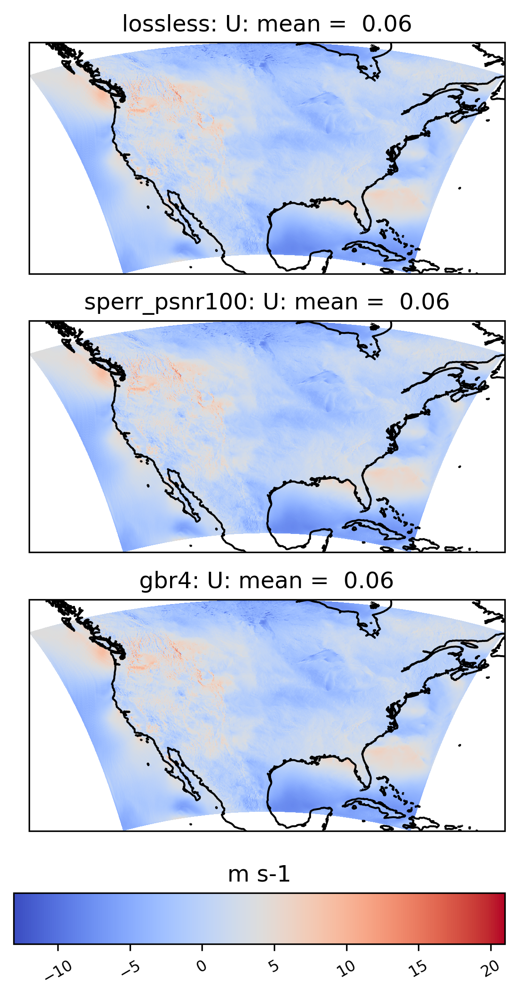

In [30]:
# Plot mean of U10 across all time slices
ldcpy.plot(
    combine_col,
    "U",
    sets=["lossless", "sperr_psnr100", "gbr4"],
    calc="mean",
    plot_type="spatial",
    vert_plot=True,
)

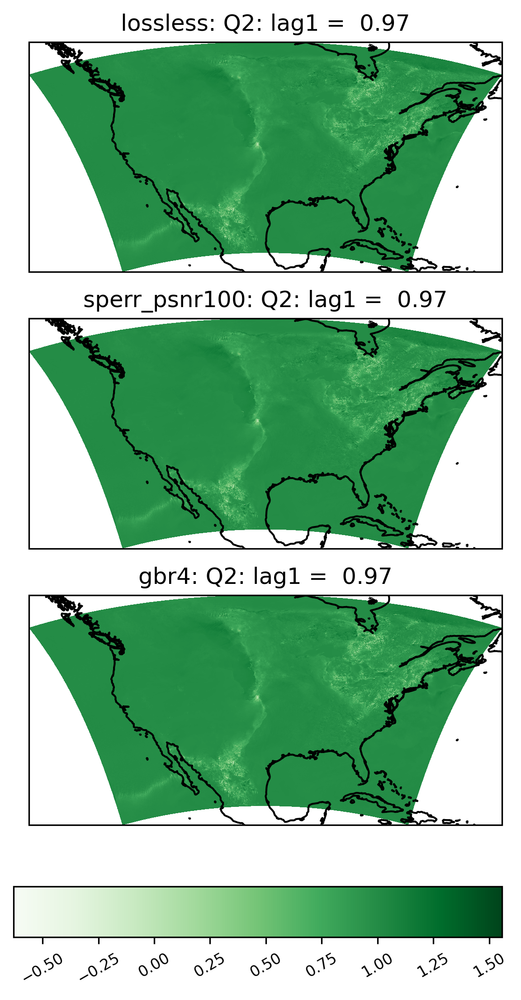

In [31]:
# plot Q2 lag1 correlation
ldcpy.plot(
    combine_col,
    "Q2",
    sets=["lossless", "sperr_psnr100", "gbr4"],
    calc="lag1",
    color="Greens",
    vert_plot=True,
)

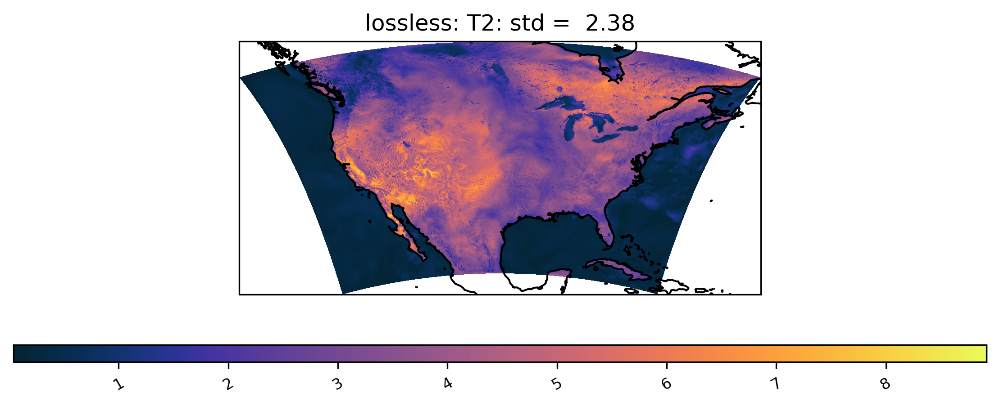

In [32]:
# plot of the standard deviation of T2 values  original "lossless" dataset
ldcpy.plot(combine_col, "T2", sets=["lossless"], calc="std", color="cmo.thermal")

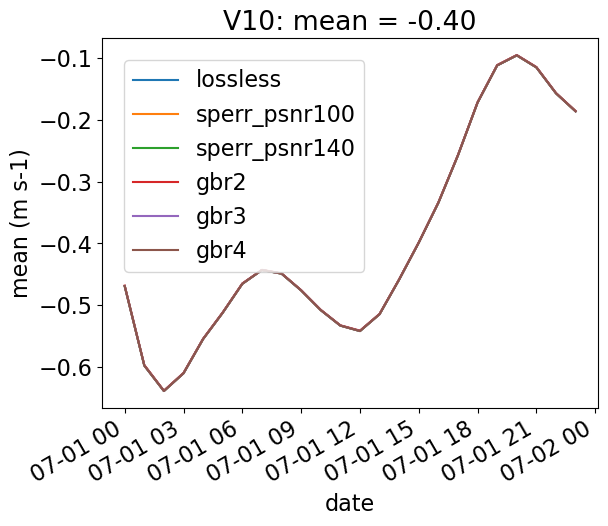

In [34]:
# Time-series plot of V10 mean
ldcpy.plot(
    combine_col,
    "V10",
    sets=["lossless", "sperr_psnr100", "sperr_psnr140", "gbr2", "gbr3", "gbr4"],
    calc="mean",
    plot_type="time_series",
    vert_plot=True,
    legend_loc="best",
)

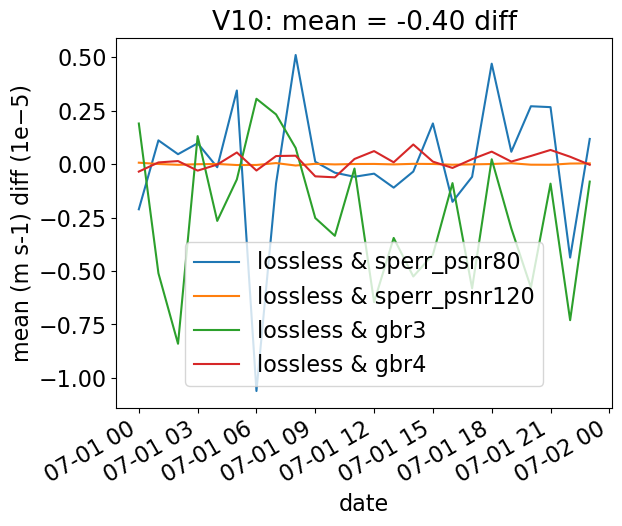

In [35]:
# Time-series plot of V10 mean  - look at differences
ldcpy.plot(
    combine_col,
    "V10",
    sets=["lossless", "sperr_psnr80", "sperr_psnr120", "gbr3", "gbr4"],
    calc="mean",
    calc_type="diff",
    plot_type="time_series",
    vert_plot=True,
    legend_loc="best",
)

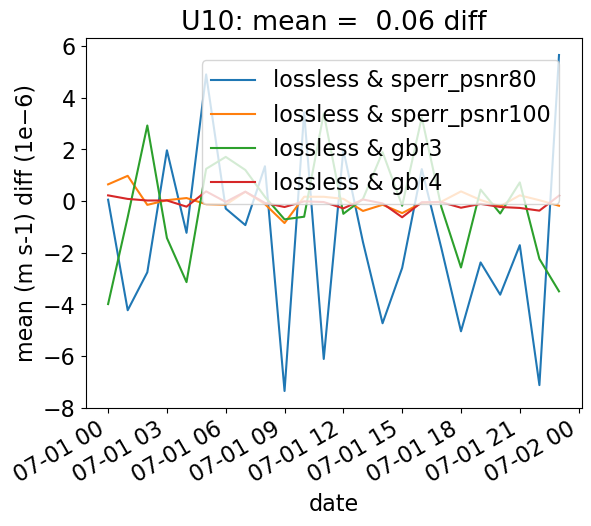

In [36]:
# Time-series plot of U10
ldcpy.plot(
    combine_col,
    "U10",
    sets=["lossless", "sperr_psnr80", "sperr_psnr100", "gbr3", "gbr4"],
    calc="mean",
    calc_type="diff",
    plot_type="time_series",
    vert_plot=True,
)

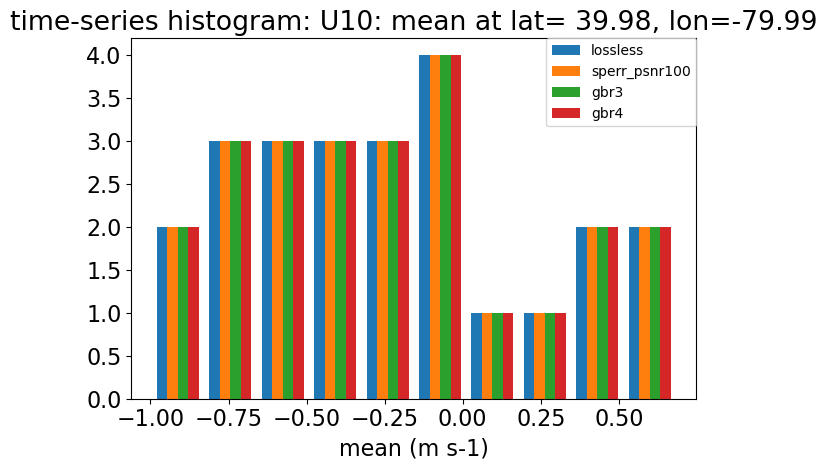

In [37]:
ldcpy.plot(
    combine_col,
    "U10",
    sets=["lossless", "sperr_psnr100", "gbr3", "gbr4"],
    calc="mean",
    plot_type="histogram",
    lat=40,
    lon=-80,
)

In [38]:
# A 3D variable has multiple layers, so we pick one
snow_layer0_time4 = combine_col.isel(Time=4).isel(snow_layers_stag=0)
ldcpy.compare_stats(
    snow_layer0_time4,
    "SNLIQ",
    ["lossless", "sperr_psnr100", "gbr4"],
    significant_digits=7,
    aggregate_dims=["y", "x"],
)

,lossless,sperr_psnr100,gbr4
mean,0.0007034585,0.0007034585,0.000703458
variance,0.0004290575,0.0004290575,0.0004290559
standard deviation,0.02071371,0.02071371,0.02071367
min value,0,0,0
min (abs) nonzero value,1.058454e-09,1.058454e-09,1.058652e-09
max value,1.229205,1.229205,1.229492
probability positive,0.001243239,0.001243239,0.001243239
number of zeros,1385780,1385780,1385780
99% real information cutoff bit,31,31,22
entropy estimate,0.001940984,0.001940984,0.001669994


,sperr_psnr100,gbr4
max abs diff,0,0.0004608631
min abs diff,0,0
mean abs diff,0,2.407321e-08
mean squared diff,0,2.609054e-19
root mean squared diff,0,1.473824e-06
normalized root mean squared diff,0,1.199005e-06
normalized max pointwise error,0,0.0003702726
pearson correlation coefficient,1,1
ks p-value,1,1
spatial relative error(% > 0.0001),0,0.002234226


In [14]:
client.shutdown()

2025-02-14 10:47:07,016 - distributed.deploy.adaptive_core - INFO - Adaptive stop
